In [125]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

class TrafficSignDetector:
    def __init__(self, images_dir, train_images_dir):
        """
        Initialize the TrafficSignDetector with directories for images.

        :param images_dir: Path to the root image directory.
        :param train_images_dir: Path to the training images subdirectory.
        """
        self.images_dir = images_dir
        self.train_images_dir = train_images_dir

        # Placeholders for various stages of processing.
        self.original_image = None
        self.gray_image = None
        self.blurred_image = None
        self.edges = None
        self.binary_image = None
        self.contours = None
        self.output_image = None

    def process_image(self, image_name):
        """
        Process an image through the detection pipeline:
          1. Load image (color) and convert to grayscale.
          2. Apply a Gaussian blur.
          3. Use Canny edge detection.
          4. Threshold the grayscale image (using Otsu's method) to obtain a binary image.
          5. Find contours with CHAIN_APPROX_NONE (which returns full boundary points,
             analogous to a Freeman chain code representation).
          6. Draw the contours on a copy of the original image.
          
        :param image_name: Filename of the image to process.
        """
        # Build the full image path and load the image.
        image_path = os.path.join(self.images_dir, self.train_images_dir, image_name)
        self.original_image = cv2.imread(image_path)
        if self.original_image is None:
            raise ValueError(f"Error: Unable to load image from path '{image_path}'")

        # 1. Convert to grayscale.
        self.gray_image = cv2.cvtColor(self.original_image, cv2.COLOR_BGR2GRAY)

        # 2. Apply Gaussian blur (using a fixed 5x5 kernel as in the article).
        self.blurred_image = cv2.GaussianBlur(self.gray_image, (5, 5), 0)

        # 3. Apply Canny edge detection.
        self.edges = cv2.Canny(self.blurred_image, 50, 150)


        # 5. Find contours using the CHAIN_APPROX_NONE flag.
        #    This flag makes sure that all contour points are stored,
        #    which is equivalent to having the full chain code.
        # check if the countours are circles
        self.contours, h = cv2.findContours(self.edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        #check if the contours are circles
        self.filtered_countours = []
        for cnt in self.contours:
            approx = cv2.approxPolyDP(cnt, 0.04*cv2.arcLength(cnt, True), True)
            if len(approx) == 8:
                k = cv2.isContourConvex(approx)
                if k:
                    self.filtered_countours.append(cnt)

        # For demonstration: print the number of points for each contour.
        #for idx, contour in enumerate(self.contours):
            #print(f"Contour {idx} has {len(contour)} points (chain-code representation).")

        # 6. Draw all detected contours on a copy of the original image.
        self.output_image = self.original_image.copy()
        cv2.drawContours(self.output_image, self.filtered_countours, -1, (0, 255, 0), 2)

    def visualize_results(self):
        """
        Visualize the different stages of processing using matplotlib.
        """
        plt.figure(figsize=(15, 10))

        # Convert BGR to RGB for proper matplotlib display.
        original_rgb = cv2.cvtColor(self.original_image, cv2.COLOR_BGR2RGB)
        output_rgb = cv2.cvtColor(self.output_image, cv2.COLOR_BGR2RGB)

        # Original Image
        plt.subplot(2, 3, 1)
        plt.title("Original Image")
        plt.imshow(original_rgb)
        plt.axis("off")

        # Grayscale Image
        plt.subplot(2, 3, 2)
        plt.title("Grayscale")
        plt.imshow(self.gray_image, cmap="gray")
        plt.axis("off")

        # Gaussian Blurred Image
        plt.subplot(2, 3, 3)
        plt.title("Gaussian Blurred")
        plt.imshow(self.blurred_image, cmap="gray")
        plt.axis("off")

        # Canny Edges
        plt.subplot(2, 3, 4)
        plt.title("Canny Edges")
        plt.imshow(self.edges, cmap="gray")
        plt.axis("off")


        # Output Image with Contours
        plt.subplot(2, 3, 5)
        plt.title("Contours (CHAIN_APPROX_NONE)")
        plt.imshow(output_rgb)
        plt.axis("off")

        plt.tight_layout()
        plt.show()


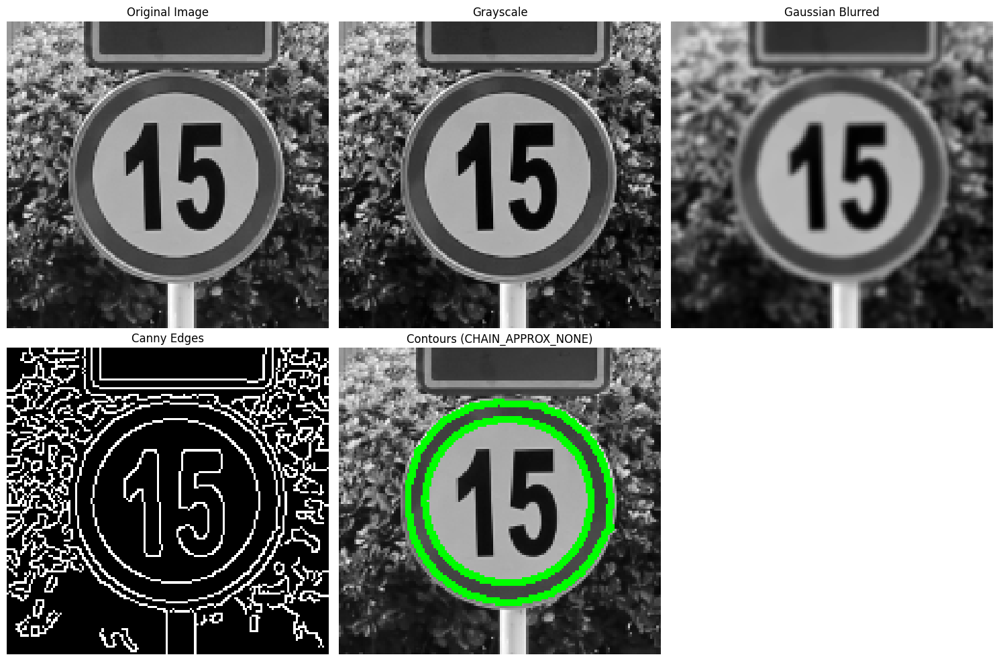

In [126]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_easy_1.png")
detector.visualize_results()

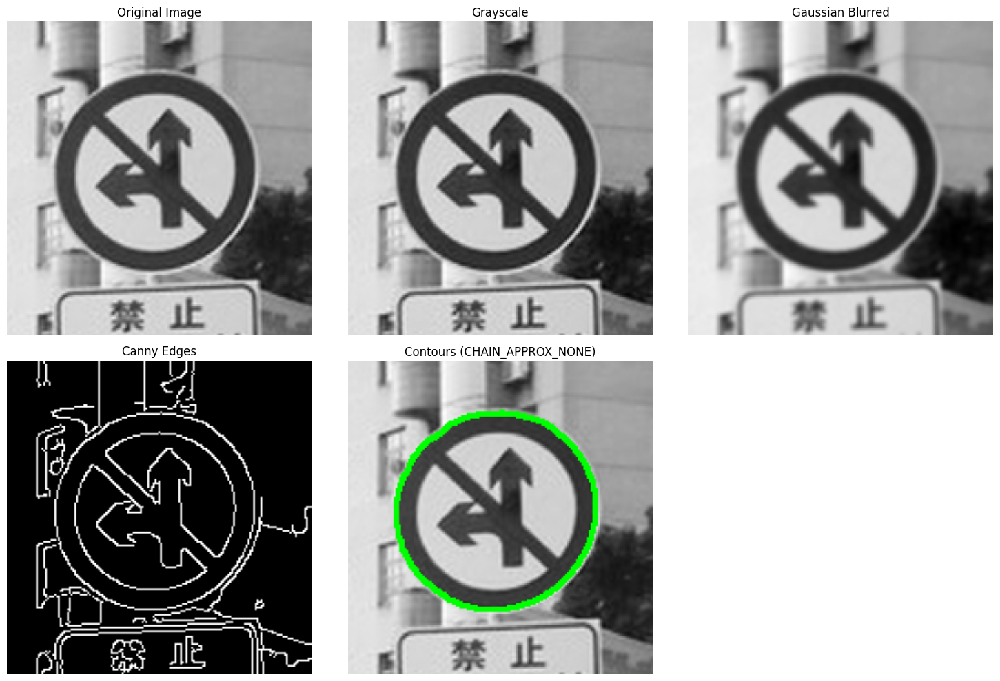

In [127]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_easy_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


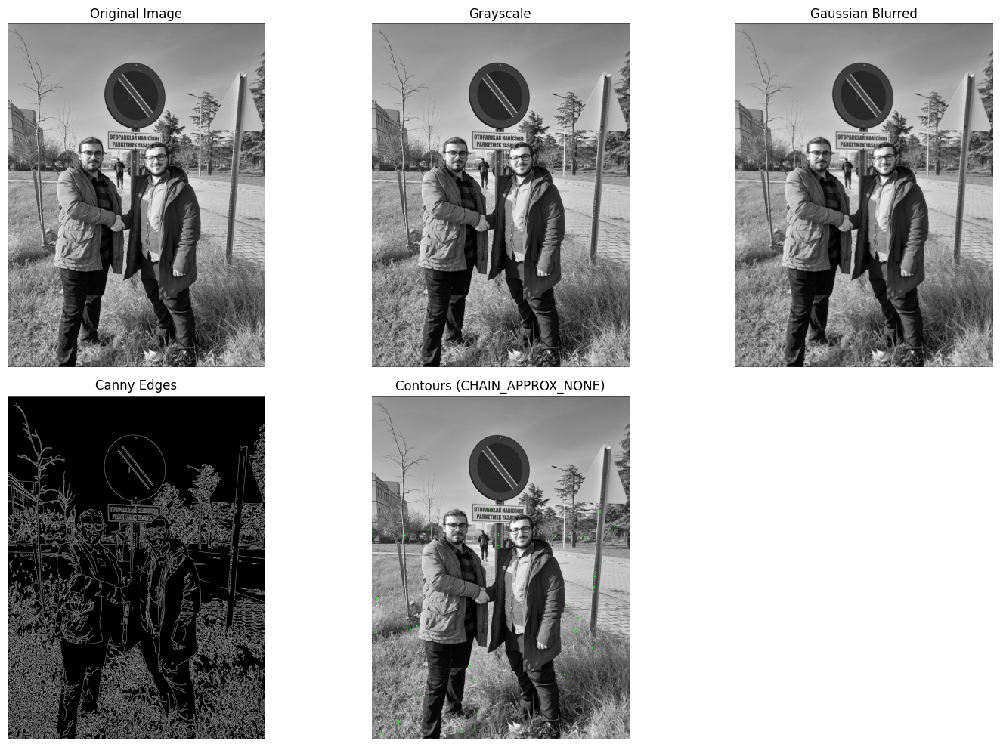

In [128]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_middle_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


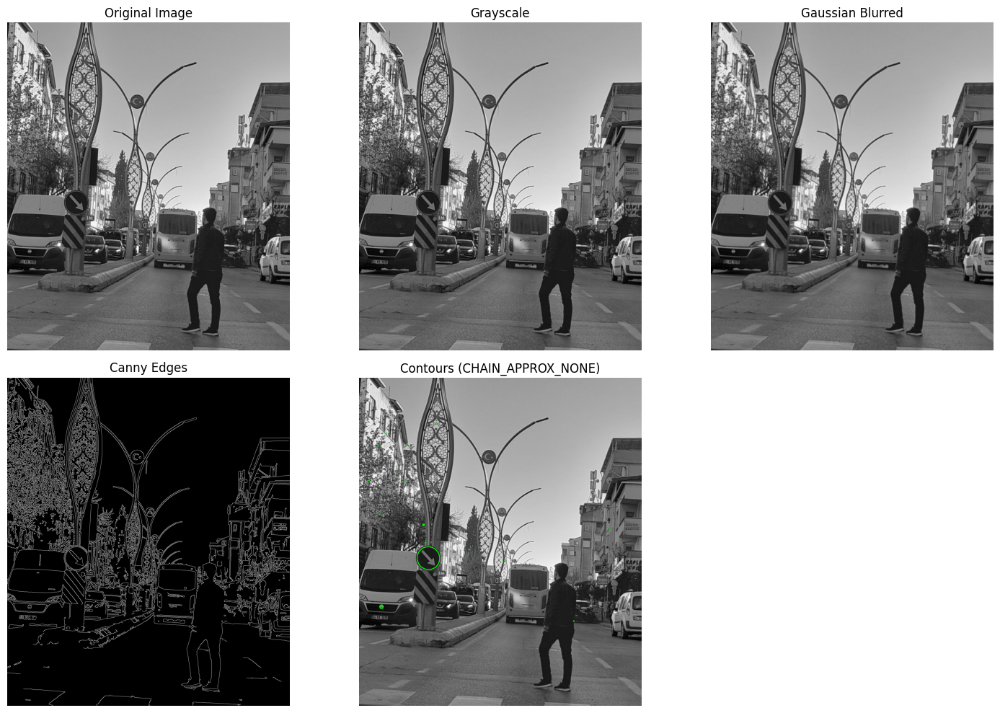

In [129]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train")
detector.process_image("train_hard_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


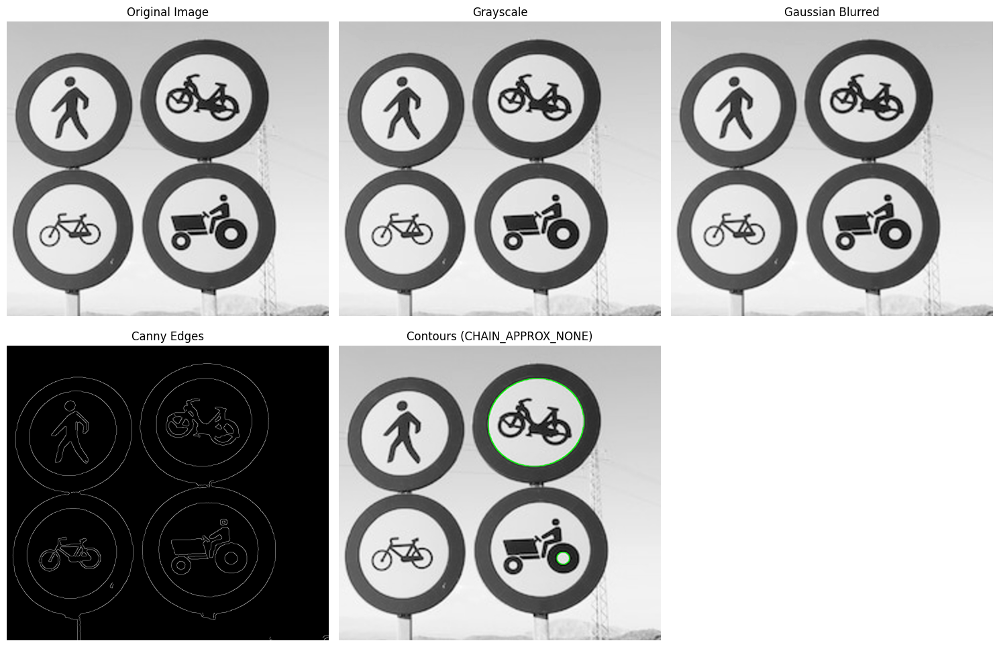

In [130]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_easy_1.png")
detector.visualize_results()

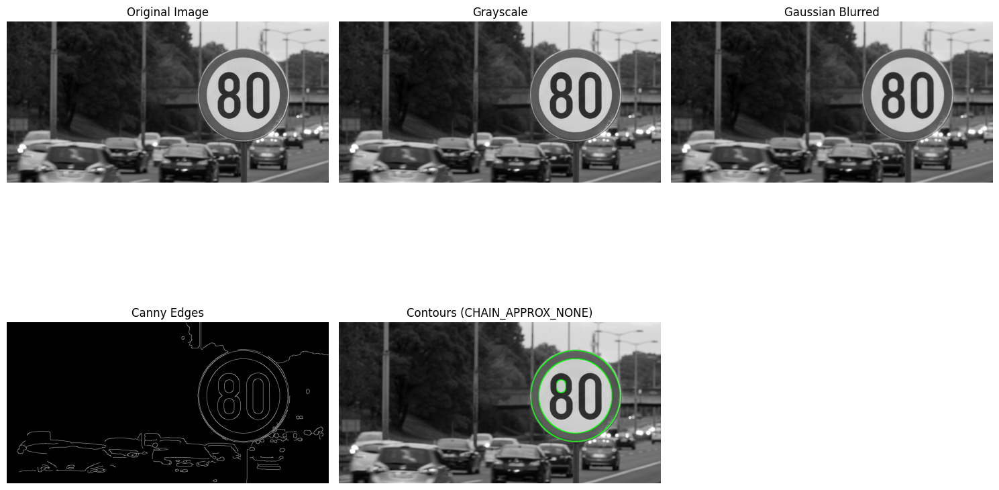

In [131]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_middle_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


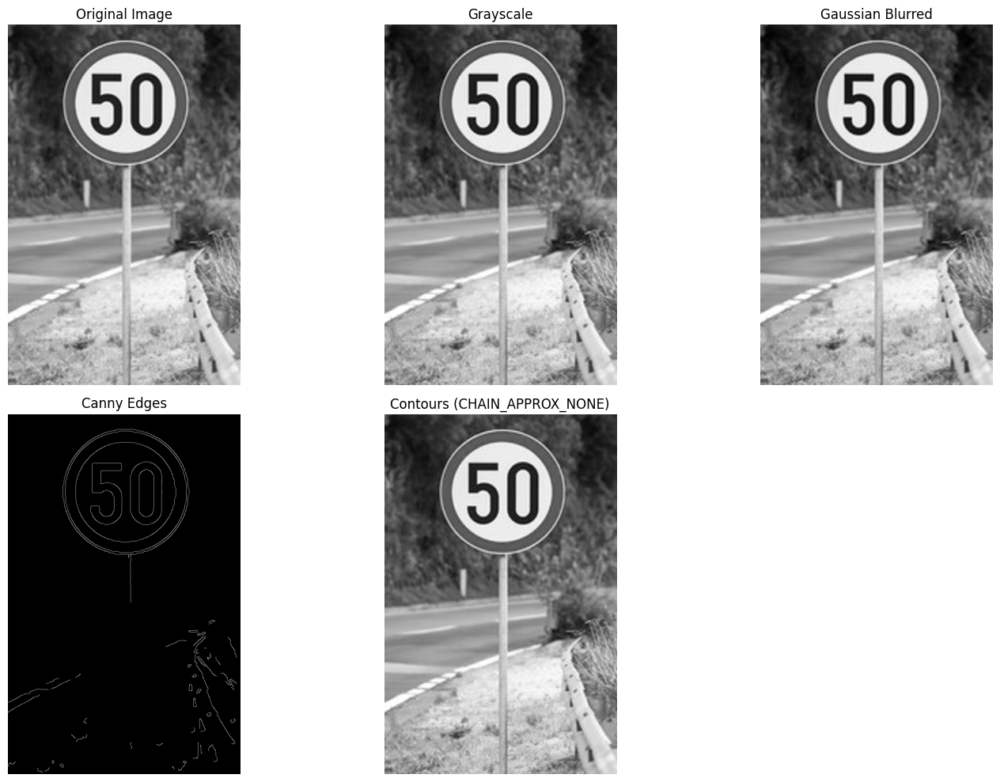

In [132]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_middle_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


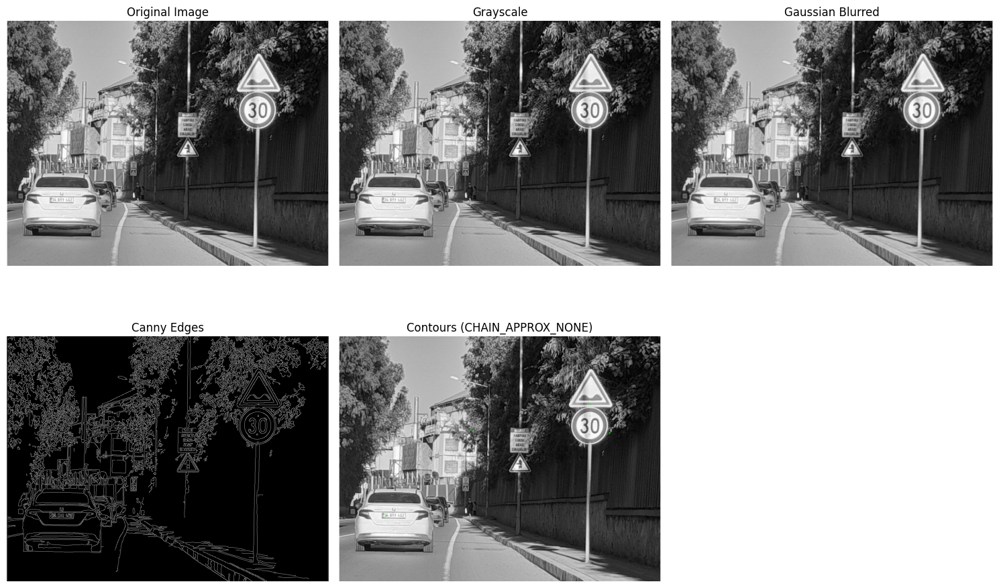

In [133]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_hard_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


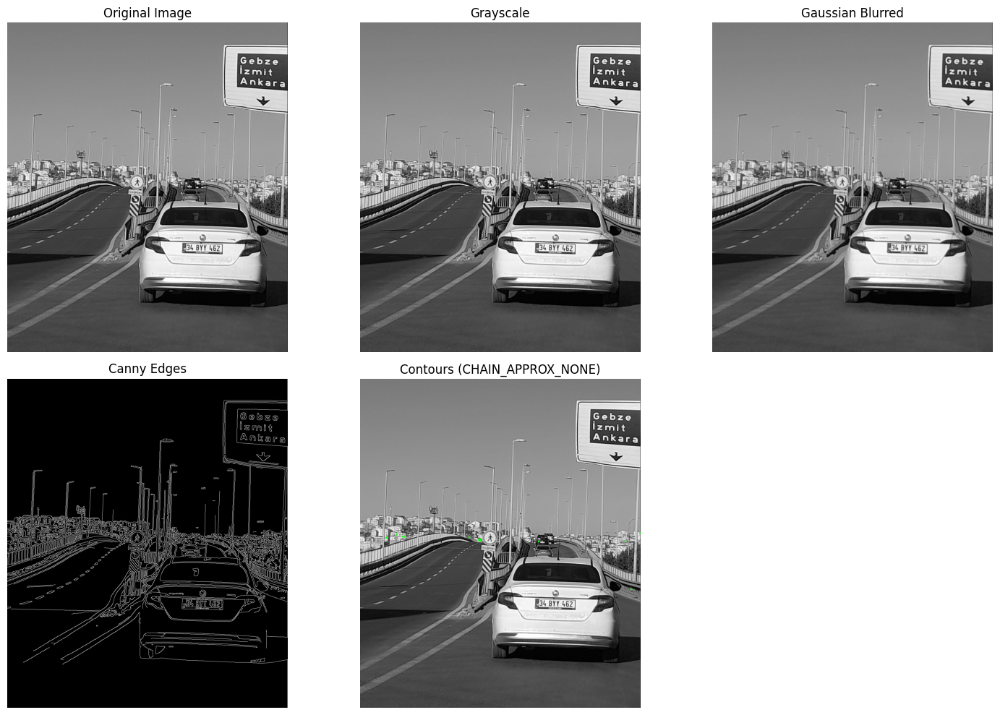

In [134]:
detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
detector.process_image("test_hard_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


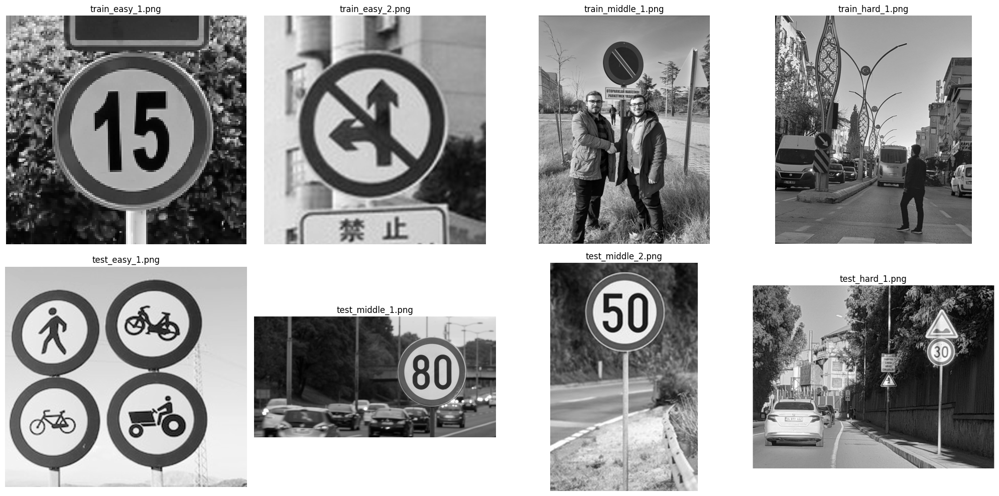

In [135]:
train_images_names = ["train_easy_1.png", "train_easy_2.png", "train_middle_1.png", "train_hard_1.png"]
test_images_names = ["test_easy_1.png", "test_middle_1.png", "test_middle_2.png", "test_hard_1.png"]

#read images
train_images = [cv2.imread(os.path.join("main_images_gray", "train", image_name), cv2.IMREAD_GRAYSCALE) for image_name in train_images_names]   
test_images = [cv2.imread(os.path.join("main_images_gray", "test", image_name), cv2.IMREAD_GRAYSCALE) for image_name in test_images_names]

#plot images
plt.figure(figsize=(20, 10))
for i, image in enumerate(train_images + test_images, 1):
    plt.subplot(2, 4, i)
    plt.imshow(image, cmap="gray")
    plt.axis("off")
for i, image_name in enumerate(train_images_names + test_images_names, 1):
    plt.subplot(2, 4, i)
    plt.title(image_name)
plt.tight_layout()
plt.show()


libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


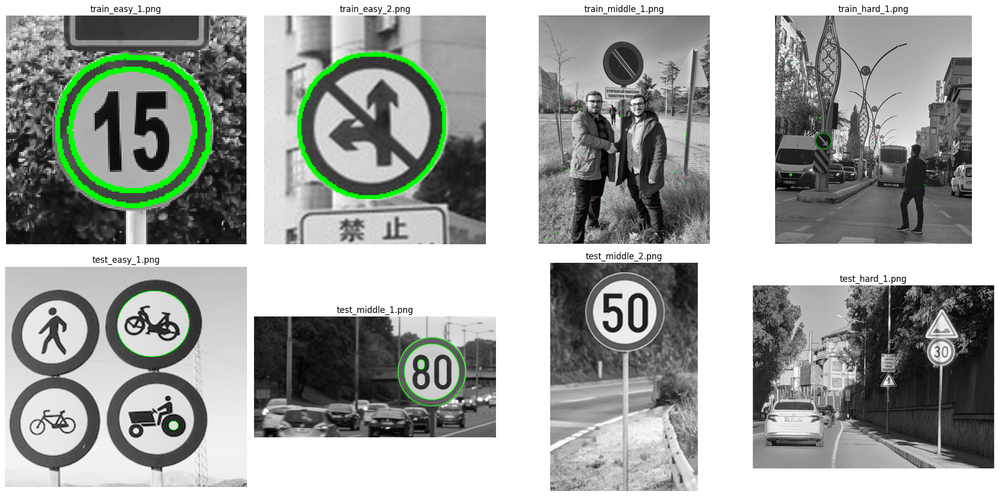

In [136]:
plt.figure(figsize=(20, 10))
# plot all the output images
for i, image_name in  enumerate(train_images_names + test_images_names, 1):
    detector = TrafficSignDetector(images_dir="main_images_gray", train_images_dir="train") if i <= len(train_images_names) \
    else TrafficSignDetector(images_dir="main_images_gray", train_images_dir="test")
    detector.process_image(image_name)
    plt.subplot(2,4 , i)
    plt.imshow(detector.output_image, cmap="gray")
    plt.title(image_name)
    plt.axis("off")
plt.tight_layout()
    